In [1]:
import itertools
import numpy as np
import pandas as pd
from scipy.stats import ttest_ind
import anndata

import matplotlib.pyplot as plt
from statsmodels.stats.multitest import multipletests
import seaborn as sns

from dredFISH.Utils import basicu
from dredFISH.Utils import powerplots

In [2]:
def get_normed_bulks(mat, genes, types, genes_sel_idx=None):
    """
    Assume cell by gene
    - select expressed genes
    - sparse to dense
    - merge cells to clusters
    - log10(CPM+1) norm bulk samples
    """
    ncell, ngene = mat.shape
    cellcov = np.asarray(mat.sum(axis=1)).reshape(-1,)
    genecov = np.asarray(mat.sum(axis=0)).reshape(-1,)
    
    if genes_sel_idx is None:
        cond = genecov>ncell*0.01 # expressed in at least 1% of cells
        matsub = np.asarray(mat[:,cond].todense())
        genes_sel = genes[cond]
    else:
        matsub = np.asarray(mat[:,genes_sel_idx].todense())
        genes_sel = genes[genes_sel_idx]
    
    # pseudo-bulk samples -- pull counts from cells
    Xk, xclsts = basicu.group_sum(matsub, types)
    ck, xclsts = basicu.group_sum(cellcov.reshape(-1,1), types)
    Xk = np.log10(1+(np.array(Xk)/np.array(ck))*1e6) # log10(1+CPM)
    df = pd.DataFrame(Xk, index=xclsts, columns=genes_sel)
    return df.T # gene by types 

def get_normed_bulks_for_adata_by_types(adata, genes_cndd=None):
    """
    """
    if genes_cndd is None:
        genes_sel_idx = None
    else:
        genes_sel_idx = basicu.get_index_from_array(adata.var.index.values, genes_cndd)
        if np.sum(genes_sel_idx == -1) > 0:
            print("some genes are not there")
            genes_sel_idx = genes_sel_idx[genes_sel_idx!=-1]
            
    return get_normed_bulks(adata.X.copy(), adata.var.index.values, adata.obs['Type'], 
                            genes_sel_idx=genes_sel_idx)

In [3]:
sns.set_context('talk')

In [4]:
f = "/greendata/GeneralStorage/fangming/projects/visctx/data_dump/MERFISH_gene_panel_ver_3-2_Feb2023.csv"
df_merfish = pd.read_csv(f)

# # df_merfish = df_merfish[~df_merfish[0].isnull()]
cnddts = df_merfish['gene_name_data'].values
unq, cnts = np.unique(cnddts, return_counts=True)
print(len(cnddts), unq.shape, unq[cnts>1])

df_merfish

677 (677,) []


,gene_name_vizgen,gene_name_data,Annot1,Annot2,Annot3,Unnamed: 5
0,Matn2,Matn2,A>C>B,screened,NaN,NaN
1,Egfem1,Egfem1,A>C>B,screened,NaN,NaN
2,Grb14,Grb14,A>C>B,*,NaN,NaN
3,Adamts17,Adamts17,A>C>B,*,NaN,NaN
4,Ldb2,Ldb2,A>C>B,*,NaN,NaN
...,...,...,...,...,...,...
672,Slc39a2,Slc39a2,Endo,DR_dn,NaN,NaN
673,Zfp366,Zfp366,Endo,DR_dn,NaN,NaN
674,Slc35a2,Slc35a2,VLMC_A,DR_up,NaN,NaN
675,Sephs1,Sephs1,VLMC_B,DR_up,NaN,NaN


In [5]:
f = '../data_dump/counts/P28_nr_allcells_Oct24.h5ad'
adata_nr = anndata.read(f)
f = '../data_dump/counts/P28_dr_allcells_Oct25.h5ad'
adata_dr = anndata.read(f)

genes_data = adata_nr.var.index.values

adata_nr, adata_dr, genes_data

/home/fangming/anaconda3/envs/routine/lib/python3.10/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/fangming/anaconda3/envs/routine/lib/python3.10/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


(AnnData object with n_obs × n_vars = 23930 × 53547
     obs: 'cov', 'covfactor', 'batch', 'n_genes', 'percent_mito', 'n_counts', 'leiden', 'Doublet', 'Doublet Score', 'Class_broad', 'sample', 'Type', 'Subclass'
     var: 'id',
 AnnData object with n_obs × n_vars = 24816 × 53547
     obs: 'cov', 'covfactor', 'n_genes', 'percent_mito', 'n_counts', 'Doublet', 'Doublet Score', 'batch', 'leiden', 'sample', 'Type', 'Subclass'
     var: 'id',
 array(['4933401J01Rik', 'Gm26206', 'Xkr4', ..., 'CAAA01064564.1',
        'Vmn2r122', 'CAAA01147332.1'], dtype=object))

In [6]:
gunsel = [g for g in cnddts if g not in genes_data]
len(gunsel), gunsel

(2, ['Magi1', 'Bcl11b'])

In [7]:
genes_cndd = np.array([g for g in cnddts if g in genes_data])
len(genes_cndd)

675

In [8]:
nr_types = np.sort(adata_nr.obs['Type'].unique().astype(str))
dr_types = np.sort(adata_dr.obs['Type'].unique().astype(str))
nr_types, dr_types

(array(['Astro_A', 'Astro_B', 'Endo', 'Frem1', 'L2/3_A', 'L2/3_B',
        'L2/3_C', 'L4_A', 'L4_B', 'L4_C', 'L5IT', 'L5NP', 'L5PT_A',
        'L5PT_B', 'L6CT_A', 'L6CT_B', 'L6CT_C', 'L6IT_A', 'L6IT_B', 'L6b',
        'Lamp5', 'Micro', 'OD_A', 'OD_B', 'OD_C', 'OPC_A', 'OPC_B',
        'Pvalb_A', 'Pvalb_B', 'Pvalb_C', 'Pvalb_D', 'Sst_A', 'Sst_B',
        'Sst_C', 'Sst_D', 'Sst_E', 'Stac', 'VLMC_A', 'VLMC_B', 'Vip_A',
        'Vip_B', 'Vip_C'], dtype='<U7'),
 array(['Astro_A', 'Astro_B', 'Endo', 'Frem1', 'L2/3_1', 'L2/3_2',
        'L2/3_3', 'L4_1', 'L4_2', 'L4_C', 'L5IT', 'L5NP', 'L5PT_A',
        'L5PT_B', 'L6CT_A', 'L6CT_B', 'L6CT_C', 'L6IT_A', 'L6IT_B', 'L6b',
        'Lamp5', 'Micro', 'OD_A', 'OD_B', 'OD_C', 'OPC_A', 'OPC_B',
        'Pvalb_A', 'Pvalb_B', 'Pvalb_C', 'Pvalb_D', 'Sst_A', 'Sst_B',
        'Sst_C', 'Sst_D', 'Sst_E', 'Stac', 'VLMC_A', 'VLMC_B', 'Vip_A',
        'Vip_B', 'Vip_C'], dtype='<U7'))

In [9]:
adata_nr.obs['biosample'] = adata_nr.obs['sample'].apply(lambda x: x[:-1])
adata_dr.obs['biosample'] = adata_dr.obs['sample'].apply(lambda x: x[:-1])
samples_nr = np.unique(adata_nr.obs['biosample'])
samples_dr = np.unique(adata_dr.obs['biosample'])
samples_nr, samples_dr

(array(['P28_1', 'P28_2'], dtype=object),
 array(['P28_dr_1', 'P28_dr_3'], dtype=object))

In [10]:
%%time
dfs_nr = []
for samp in samples_nr:
    adatasub = adata_nr[adata_nr.obs['biosample']==samp]
    df = get_normed_bulks_for_adata_by_types(adatasub, genes_cndd=genes_cndd)
    print(df.shape)
    print(df.columns)
    dfs_nr.append(df)

dfs_dr = []
for samp in samples_dr:
    adatasub = adata_dr[adata_dr.obs['biosample']==samp]
    df = get_normed_bulks_for_adata_by_types(adatasub, genes_cndd=genes_cndd)
    print(df.shape)
    print(df.columns)
    dfs_dr.append(df)

(675, 42)
Index(['Astro_A', 'Astro_B', 'Endo', 'Frem1', 'L2/3_A', 'L2/3_B', 'L2/3_C',
       'L4_A', 'L4_B', 'L4_C', 'L5IT', 'L5NP', 'L5PT_A', 'L5PT_B', 'L6CT_A',
       'L6CT_B', 'L6CT_C', 'L6IT_A', 'L6IT_B', 'L6b', 'Lamp5', 'Micro', 'OD_A',
       'OD_B', 'OD_C', 'OPC_A', 'OPC_B', 'Pvalb_A', 'Pvalb_B', 'Pvalb_C',
       'Pvalb_D', 'Sst_A', 'Sst_B', 'Sst_C', 'Sst_D', 'Sst_E', 'Stac',
       'VLMC_A', 'VLMC_B', 'Vip_A', 'Vip_B', 'Vip_C'],
      dtype='object')
(675, 42)
Index(['Astro_A', 'Astro_B', 'Endo', 'Frem1', 'L2/3_A', 'L2/3_B', 'L2/3_C',
       'L4_A', 'L4_B', 'L4_C', 'L5IT', 'L5NP', 'L5PT_A', 'L5PT_B', 'L6CT_A',
       'L6CT_B', 'L6CT_C', 'L6IT_A', 'L6IT_B', 'L6b', 'Lamp5', 'Micro', 'OD_A',
       'OD_B', 'OD_C', 'OPC_A', 'OPC_B', 'Pvalb_A', 'Pvalb_B', 'Pvalb_C',
       'Pvalb_D', 'Sst_A', 'Sst_B', 'Sst_C', 'Sst_D', 'Sst_E', 'Stac',
       'VLMC_A', 'VLMC_B', 'Vip_A', 'Vip_B', 'Vip_C'],
      dtype='object')
(675, 42)
Index(['Astro_A', 'Astro_B', 'Endo', 'Frem1', 'L2/3_1', 'L2/

In [11]:
genes_comm = adata_nr.var.index.values
for df in dfs_nr:
    genes_comm = np.intersect1d(genes_comm, df.index.values)
    print(genes_comm.shape)
for df in dfs_dr:
    genes_comm = np.intersect1d(genes_comm, df.index.values)
    print(genes_comm.shape)
    
for i in range(2):
    dfs_nr[i] = dfs_nr[i].loc[genes_comm]
    dfs_dr[i] = dfs_dr[i].loc[genes_comm]

(675,)
(675,)
(675,)
(675,)


In [12]:
tensor_nr = np.stack(dfs_nr, axis=2)
tensor_dr = np.stack(dfs_dr, axis=2)
tensor_nr.shape, tensor_dr.shape

((675, 42, 2), (675, 42, 2))

# visualize

In [13]:
gsel = genes_comm
gidx = basicu.get_index_from_array(genes_comm, gsel)
gidx.shape

(675,)

In [14]:
types_order = [
    'L2/3_A', 'L2/3_B', 'L2/3_C', 
    'L4_A', 'L4_B', 'L4_C', 
    'L5IT', 
    'L6IT_A', 'L6IT_B', 
    'L5PT_A', 'L5PT_B', 
    'L5NP', 
    'L6CT_A', 'L6CT_B', 'L6CT_C', 
    'L6b',
    
    'Pvalb_A', 'Pvalb_B', 'Pvalb_C', 'Pvalb_D', 
    'Sst_A', 'Sst_B', 'Sst_C', 'Sst_D', 'Sst_E', 
    'Vip_A', 'Vip_B', 'Vip_C',
    'Lamp5', 
    
    'Stac', 
    'Frem1', 
    
    'Astro_A', 'Astro_B', 
    'OD_A', 'OD_B', 'OD_C', 
    'OPC_A', 'OPC_B',
    'Micro', 
    'Endo', 'VLMC_A', 'VLMC_B', 
]

In [15]:
types_idx = basicu.get_index_from_array(nr_types, types_order)
types_idx

array([ 4,  5,  6,  7,  8,  9, 10, 17, 18, 12, 13, 11, 14, 15, 16, 19, 27,
       28, 29, 30, 31, 32, 33, 34, 35, 39, 40, 41, 20, 36,  3,  0,  1, 22,
       23, 24, 25, 26, 21,  2, 37, 38])

In [16]:
bigmat = np.hstack([
    tensor_nr[:,:,0][:,types_idx],
    tensor_nr[:,:,1][:,types_idx],
    tensor_dr[:,:,0][:,types_idx],
    tensor_dr[:,:,1][:,types_idx],
])

ncols = int(bigmat.shape[1]/4)
reidx = np.array([i+j*ncols for (i,j) in itertools.product(np.arange(ncols), np.arange(4))])
print(reidx)
bigmat = bigmat[:,reidx]

[  0  42  84 126   1  43  85 127   2  44  86 128   3  45  87 129   4  46
  88 130   5  47  89 131   6  48  90 132   7  49  91 133   8  50  92 134
   9  51  93 135  10  52  94 136  11  53  95 137  12  54  96 138  13  55
  97 139  14  56  98 140  15  57  99 141  16  58 100 142  17  59 101 143
  18  60 102 144  19  61 103 145  20  62 104 146  21  63 105 147  22  64
 106 148  23  65 107 149  24  66 108 150  25  67 109 151  26  68 110 152
  27  69 111 153  28  70 112 154  29  71 113 155  30  72 114 156  31  73
 115 157  32  74 116 158  33  75 117 159  34  76 118 160  35  77 119 161
  36  78 120 162  37  79 121 163  38  80 122 164  39  81 123 165  40  82
 124 166  41  83 125 167]


In [17]:
bigmatz = (bigmat-np.mean(bigmat, axis=1).reshape(-1,1))/np.std(bigmat, axis=1).reshape(-1,1)

/tmp/ipykernel_2559/3698215606.py:1: RuntimeWarning: invalid value encountered in true_divide
  bigmatz = (bigmat-np.mean(bigmat, axis=1).reshape(-1,1))/np.std(bigmat, axis=1).reshape(-1,1)


In [18]:
toplot = pd.DataFrame(bigmatz[gidx], index=gsel, columns=np.repeat(types_order,4))# .iloc[:50]
nrow, ncol = toplot.shape

with sns.axes_style('ticks'):
    fig, ax = plt.subplots(figsize=(0.2*ncol,0.2*nrow))
    sns.heatmap(toplot, 
                cmap='coolwarm', 
                yticklabels=True, 
                xticklabels=4, 
                cbar_kws=dict(pad=0.01, location='top', orientation='horizontal', shrink=0.3, label='zscored mean log10(CPM+1)'),
                center=0,
                ax=ax
               )
    ax.vlines(np.arange(0,ncol,2), 0, len(gidx)+1, linewidth=0.5, color='gray')
    ax.vlines(np.arange(0,ncol,4), 0, len(gidx)+1, linewidth=1, color='gray')
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=10)

    for num in np.arange(0, nrow, 10):
        ax.text(ncol, num, num, fontsize=10)
    for i, samp in enumerate(['NR1', 'NR2', 'DR1', 'DR2']):
        ax.text(0.5+i, -0.5, samp, rotation=90, ha='center', va='bottom', fontsize=10)

    powerplots.savefig_autodate(fig, "../results/merfish_v3_zscore_bigmatz.pdf")
    plt.show()

saved the figure to: ../results/merfish_v3_zscore_bigmatz_2023-02-13.pdf


In [19]:
toplot2 = pd.DataFrame(bigmat[gidx], index=gsel, columns=np.repeat(types_order,4))# .iloc[:50]
nrow, ncol = toplot.shape

with sns.axes_style('ticks'):
    fig, ax = plt.subplots(figsize=(0.2*ncol,0.2*nrow))
    sns.heatmap(toplot2, 
                cmap='rocket', # _r', #coolwarm', 
                yticklabels=True, 
                xticklabels=4, 
                cbar_kws=dict(pad=0.01, location='top', orientation='horizontal', shrink=0.3, label='mean log10(CPM+1)'),
                ax=ax
               )
    ax.vlines(np.arange(0,ncol,2), 0, len(gidx)+1, linewidth=0.5, color='gray')
    ax.vlines(np.arange(0,ncol,4), 0, len(gidx)+1, linewidth=1, color='gray')
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=10)

    for num in np.arange(0, nrow, 10):
        ax.text(ncol, num, num, fontsize=10)
    for i, samp in enumerate(['NR1', 'NR2', 'DR1', 'DR2']):
        ax.text(0.5+i, -0.5, samp, rotation=90, ha='center', va='bottom', fontsize=10)

    powerplots.savefig_autodate(fig, "../results/merfish_v3_bigmat.pdf")
    plt.show()

saved the figure to: ../results/merfish_v3_bigmat_2023-02-13.pdf


In [20]:
# save toplot
toplot

,L2/3_A,L2/3_A,L2/3_A,L2/3_A,L2/3_B,L2/3_B,L2/3_B,L2/3_B,L2/3_C,L2/3_C,...,Endo,Endo,VLMC_A,VLMC_A,VLMC_A,VLMC_A,VLMC_B,VLMC_B,VLMC_B,VLMC_B
1700016P03Rik,-0.304262,0.206660,0.835481,0.737682,0.645566,0.957169,1.668384,1.666202,0.354327,0.671910,...,0.437054,0.028124,-1.029540,-0.695034,-0.079149,-0.405198,-2.672492,-1.615223,0.045211,-0.614778
1700023F02Rik,-0.554596,0.173753,0.225755,-0.334190,0.242556,-0.053025,0.448174,0.068147,0.762096,0.905902,...,0.050253,-0.554596,-0.554596,-0.554596,-0.554596,-0.554596,-0.554596,-0.554596,2.627922,-0.554596
2310002F09Rik,1.015076,-0.102999,-0.202860,0.075413,0.150786,0.331386,-0.144816,-0.043275,-0.485152,-0.555246,...,0.968978,0.128935,-0.689737,-0.689737,-0.689737,-0.689737,1.091858,0.394776,1.517435,-0.689737
3110082I17Rik,1.424212,1.490267,1.169002,0.642707,1.042972,0.973318,0.771547,0.505726,1.097058,1.030537,...,-0.041969,0.673234,1.403258,0.694855,-1.913703,0.571928,-1.561331,-0.897553,-0.164864,-0.075033
4833422C13Rik,-0.366182,-0.073205,-0.712572,0.166866,-0.831815,-0.152992,-1.108655,0.345707,-0.082878,0.148846,...,1.082202,1.674350,-2.766729,-0.599485,-2.766729,0.318342,0.449180,-0.235888,-2.766729,-1.242976
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zfp804b,-0.275734,-0.172703,-0.074845,-0.029342,-0.094935,0.170825,-0.320723,-0.472837,-0.979314,-0.833127,...,-0.423785,-0.780581,-1.211051,-1.435978,-0.875277,-1.183180,0.217779,-0.346572,0.657068,0.522857
Zfp930,0.414624,0.665061,0.185153,-0.225321,0.043914,-0.448884,-0.261421,0.009063,0.207278,-0.130057,...,0.474053,0.164203,-3.536409,-0.320435,0.239071,-0.595655,0.603532,1.477155,0.944107,0.248698
Zfpm2,-1.194434,-1.076956,-1.036186,-1.025026,-1.443956,-1.423101,-0.934194,-0.901811,-1.437396,-1.325690,...,-0.400663,-0.666387,-0.611502,-0.260244,-0.806603,-0.000777,0.269138,0.569266,0.481244,0.306744
Zmat4,-1.397858,-1.747217,-0.601594,-0.930745,-0.737541,-0.686769,-0.524263,-0.708046,-0.004017,0.095207,...,-0.473704,-0.994762,-3.065939,-0.406285,-0.550001,-0.895760,-1.321175,-1.466339,-1.262022,-1.682033


In [21]:
toplot.to_csv('../results/merfish_v3_zscore_bigmatz.csv')

# subsets - exc

In [22]:
types_order_sub = [
    'L2/3_A', 'L2/3_B', 'L2/3_C', 
    'L4_A', 'L4_B', 'L4_C', 
    'L5IT', 
    'L6IT_A', 'L6IT_B', 
    'L5PT_A', 'L5PT_B', 
    'L5NP', 
    'L6CT_A', 'L6CT_B', 'L6CT_C', 
    'L6b',
    
#     'Pvalb_A', 'Pvalb_B', 'Pvalb_C', 'Pvalb_D', 
#     'Sst_A', 'Sst_B', 'Sst_C', 'Sst_D', 'Sst_E', 
#     'Vip_A', 'Vip_B', 'Vip_C',
#     'Lamp5', 
    
#     'Stac', 
#     'Frem1', 
    
#     'Astro_A', 'Astro_B', 
#     'OD_A', 'OD_B', 'OD_C', 
#     'OPC_A', 'OPC_B',
#     'Micro', 
#     'Endo', 'VLMC_A', 'VLMC_B', 
]

In [23]:
types_idx = basicu.get_index_from_array(nr_types, types_order_sub)
types_idx

array([ 4,  5,  6,  7,  8,  9, 10, 17, 18, 12, 13, 11, 14, 15, 16, 19])

In [24]:
bigmat = np.hstack([
    tensor_nr[:,:,0][:,types_idx],
    tensor_nr[:,:,1][:,types_idx],
    tensor_dr[:,:,0][:,types_idx],
    tensor_dr[:,:,1][:,types_idx],
])

ncols = int(bigmat.shape[1]/4)
reidx = np.array([i+j*ncols for (i,j) in itertools.product(np.arange(ncols), np.arange(4))])
print(reidx)
bigmat = bigmat[:,reidx]

[ 0 16 32 48  1 17 33 49  2 18 34 50  3 19 35 51  4 20 36 52  5 21 37 53
  6 22 38 54  7 23 39 55  8 24 40 56  9 25 41 57 10 26 42 58 11 27 43 59
 12 28 44 60 13 29 45 61 14 30 46 62 15 31 47 63]


In [25]:
bigmatz = (bigmat-np.mean(bigmat, axis=1).reshape(-1,1))/np.std(bigmat, axis=1).reshape(-1,1)

/tmp/ipykernel_2559/3698215606.py:1: RuntimeWarning: invalid value encountered in true_divide
  bigmatz = (bigmat-np.mean(bigmat, axis=1).reshape(-1,1))/np.std(bigmat, axis=1).reshape(-1,1)


saved the figure to: ../results/merfish_v3_zscore_bigmatz_exc_demo_2023-02-13.pdf


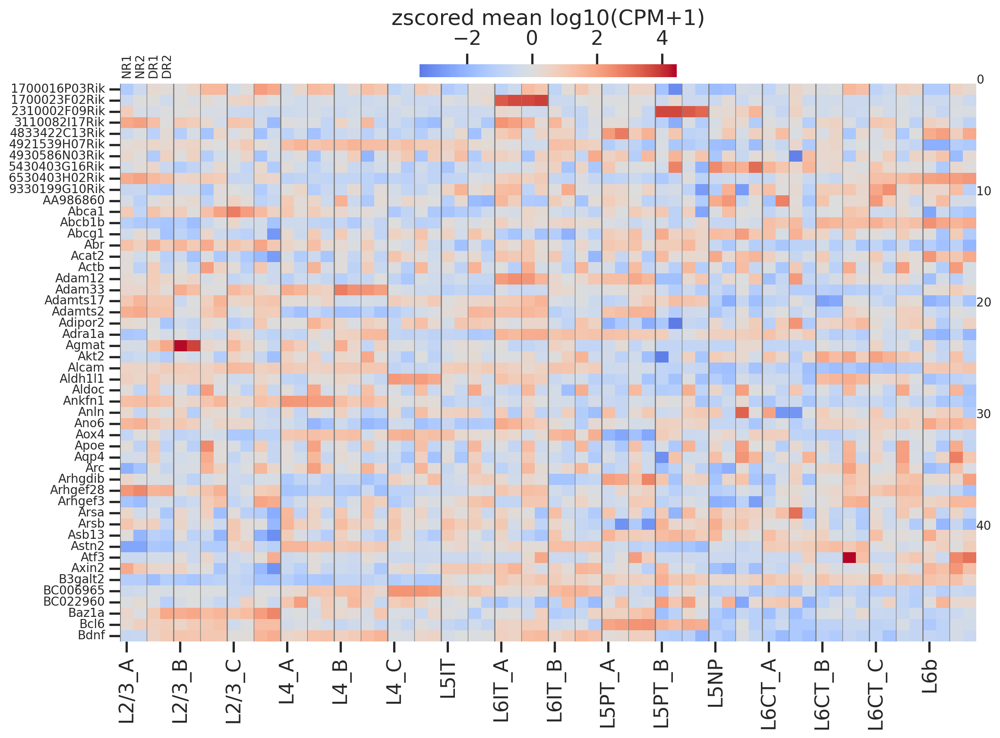

In [26]:
toplot = pd.DataFrame(bigmatz[gidx], index=gsel, columns=np.repeat(types_order_sub,4)).iloc[:50]
nrow, ncol = toplot.shape

with sns.axes_style('ticks'):
    fig, ax = plt.subplots(figsize=(0.2*ncol,0.2*nrow))
    sns.heatmap(toplot, 
                cmap='coolwarm', 
                yticklabels=True, 
                xticklabels=4, 
                cbar_kws=dict(pad=0.01, location='top', orientation='horizontal', shrink=0.3, label='zscored mean log10(CPM+1)'),
                center=0,
                ax=ax
               )
    ax.vlines(np.arange(0,ncol,2), 0, len(gidx)+1, linewidth=0.5, color='gray')
    ax.vlines(np.arange(0,ncol,4), 0, len(gidx)+1, linewidth=1, color='gray')
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=10)

    for num in np.arange(0, nrow, 10):
        ax.text(ncol, num, num, fontsize=10)
    for i, samp in enumerate(['NR1', 'NR2', 'DR1', 'DR2']):
        ax.text(0.5+i, -0.5, samp, rotation=90, ha='center', va='bottom', fontsize=10)

    powerplots.savefig_autodate(fig, "../results/merfish_v3_zscore_bigmatz_exc_demo.pdf")
    plt.show()

saved the figure to: ../results/merfish_v3_zscore_bigmatz_exc_2023-02-13.pdf


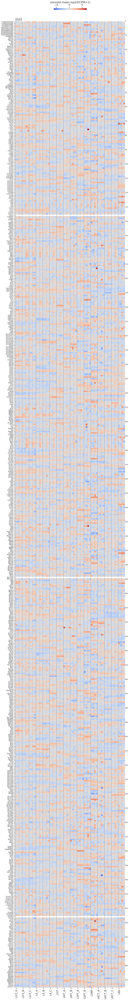

In [27]:
toplot = pd.DataFrame(bigmatz[gidx], index=gsel, columns=np.repeat(types_order_sub,4))# .iloc[:50]
nrow, ncol = toplot.shape

with sns.axes_style('ticks'):
    fig, ax = plt.subplots(figsize=(0.2*ncol,0.2*nrow))
    sns.heatmap(toplot, 
                cmap='coolwarm', 
                yticklabels=True, 
                xticklabels=4, 
                cbar_kws=dict(pad=0.01, location='top', orientation='horizontal', shrink=0.3, label='zscored mean log10(CPM+1)'),
                center=0,
                ax=ax
               )
    ax.vlines(np.arange(0,ncol,2), 0, len(gidx)+1, linewidth=0.5, color='gray')
    ax.vlines(np.arange(0,ncol,4), 0, len(gidx)+1, linewidth=1, color='gray')
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=10)

    for num in np.arange(0, nrow, 10):
        ax.text(ncol, num, num, fontsize=10)
    for i, samp in enumerate(['NR1', 'NR2', 'DR1', 'DR2']):
        ax.text(0.5+i, -0.5, samp, rotation=90, ha='center', va='bottom', fontsize=10)

    powerplots.savefig_autodate(fig, "../results/merfish_v3_zscore_bigmatz_exc.pdf")
    plt.show()

saved the figure to: ../results/merfish_v3_bigmat_exc_2023-02-13.pdf


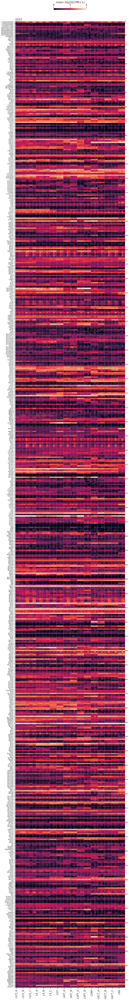

In [28]:
toplot2 = pd.DataFrame(bigmat[gidx], index=gsel, columns=np.repeat(types_order_sub,4))# .iloc[:50]
nrow, ncol = toplot.shape

with sns.axes_style('ticks'):
    fig, ax = plt.subplots(figsize=(0.2*ncol,0.2*nrow))
    sns.heatmap(toplot2, 
                cmap='rocket', # _r', #coolwarm', 
                yticklabels=True, 
                xticklabels=4, 
                cbar_kws=dict(pad=0.01, location='top', orientation='horizontal', shrink=0.3, label='mean log10(CPM+1)'),
                ax=ax
               )
    ax.vlines(np.arange(0,ncol,2), 0, len(gidx)+1, linewidth=0.5, color='gray')
    ax.vlines(np.arange(0,ncol,4), 0, len(gidx)+1, linewidth=1, color='gray')
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=10)

    for num in np.arange(0, nrow, 10):
        ax.text(ncol, num, num, fontsize=10)
    for i, samp in enumerate(['NR1', 'NR2', 'DR1', 'DR2']):
        ax.text(0.5+i, -0.5, samp, rotation=90, ha='center', va='bottom', fontsize=10)

    powerplots.savefig_autodate(fig, "../results/merfish_v3_bigmat_exc.pdf")
    plt.show()